In [ ]:
import cv2
from matplotlib import pyplot as plt
import numpy as np

In [ ]:
#loading the images as input
imgBird = cv2.imread("Bird.jpg",0)
imgPalace = cv2.imread("Palace.jpg",0)

(683, 1024)


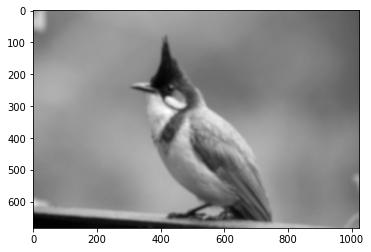

In [ ]:
#details of the image "Bird.jpg"
print(imgBird.shape)
plt.imshow(imgBird, cmap='gray')
plt.show()

(570, 1024)


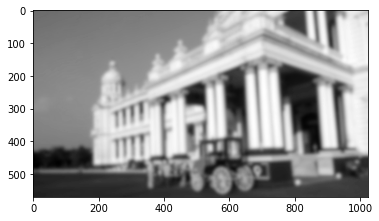

In [ ]:
#details of the image "Palace.jpg"
print(imgPalace.shape)
plt.imshow(imgPalace, cmap='gray')
plt.show()

images:  Bird lower sigma:  1 higher sigma:  2


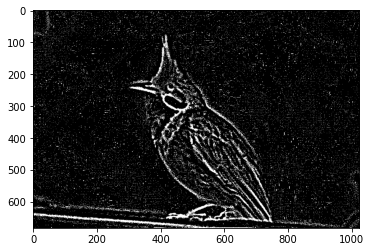

filter orientation:  0


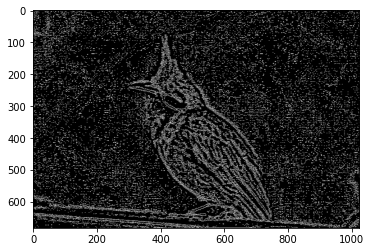

filter orientation:  45


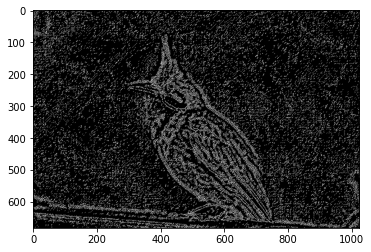

filter orientation:  90


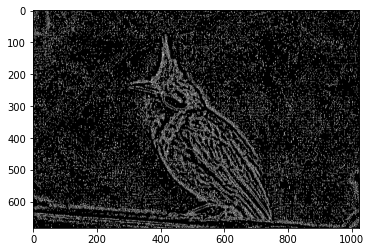

filter orientation:  135


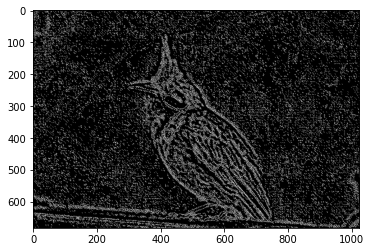

Superimpose the edge image: 


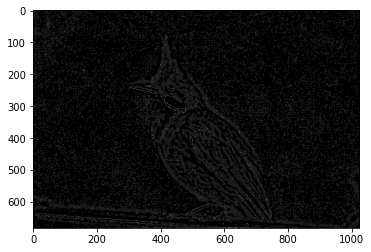




images:  Bird lower sigma:  1 higher sigma:  2.5


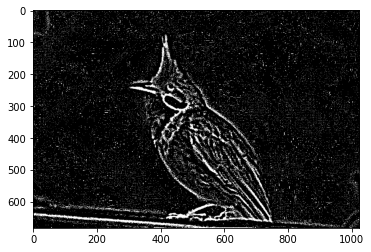

filter orientation:  0


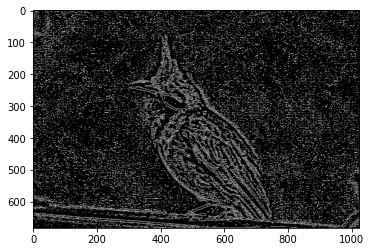

filter orientation:  45


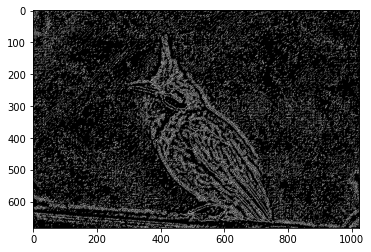

filter orientation:  90


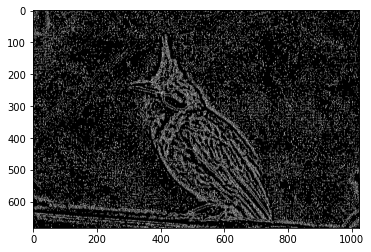

filter orientation:  135


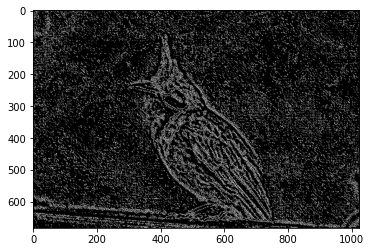

Superimpose the edge image: 


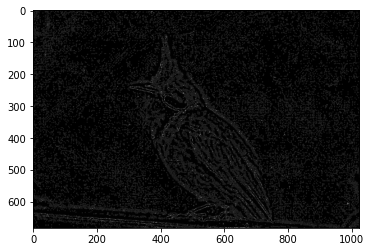




images:  Bird lower sigma:  1 higher sigma:  3


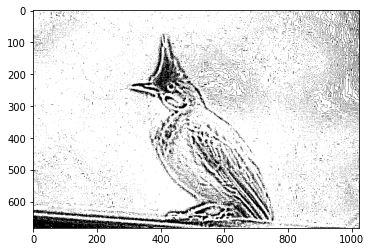

filter orientation:  0


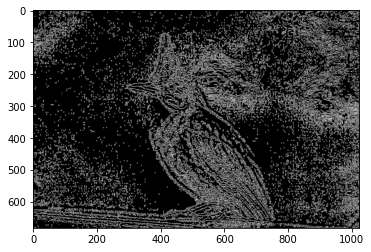

filter orientation:  45


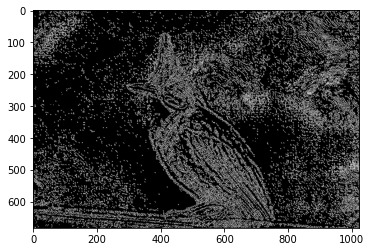

filter orientation:  90


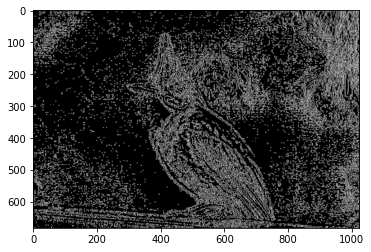

filter orientation:  135


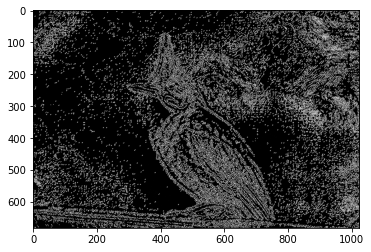

Superimpose the edge image: 


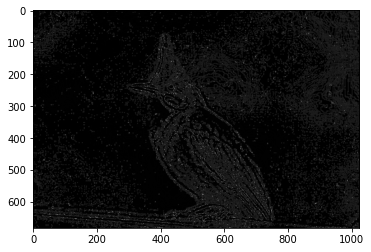




images:  Bird lower sigma:  2 higher sigma:  4


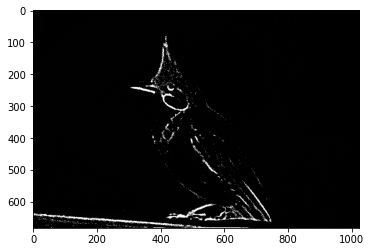

filter orientation:  0


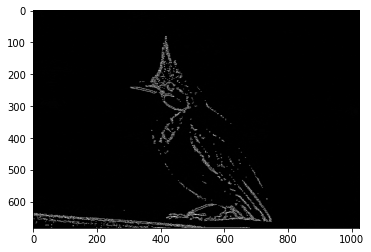

filter orientation:  45


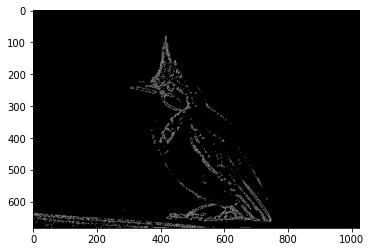

filter orientation:  90


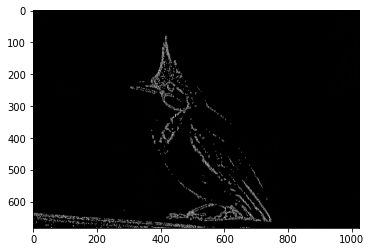

filter orientation:  135


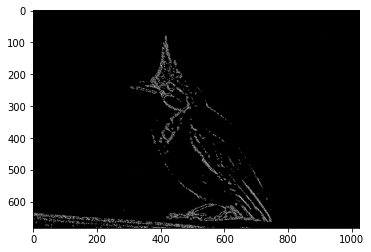

Superimpose the edge image: 


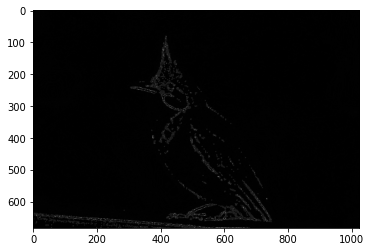




images:  Bird lower sigma:  2 higher sigma:  5.0


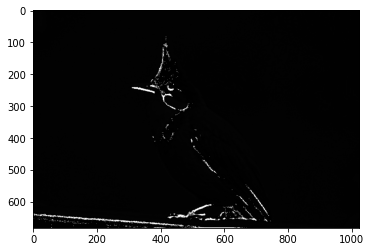

filter orientation:  0


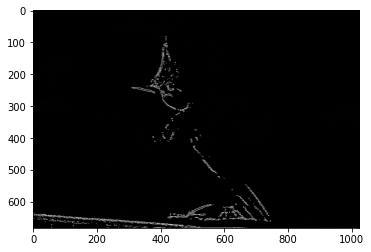

filter orientation:  45


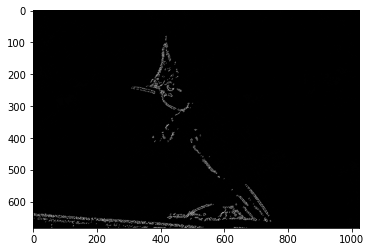

filter orientation:  90


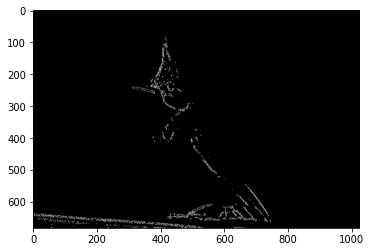

filter orientation:  135


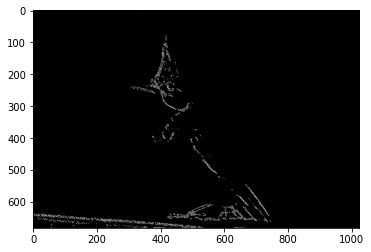

Superimpose the edge image: 


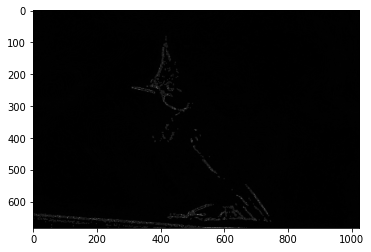




images:  Bird lower sigma:  2 higher sigma:  6


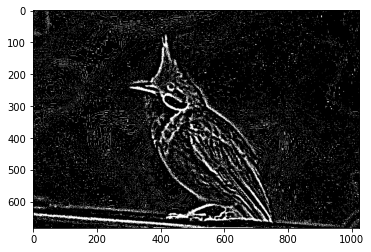

filter orientation:  0


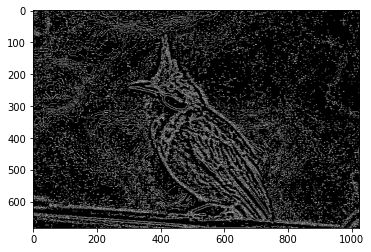

filter orientation:  45


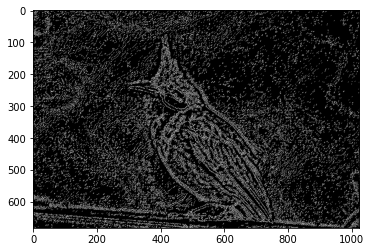

filter orientation:  90


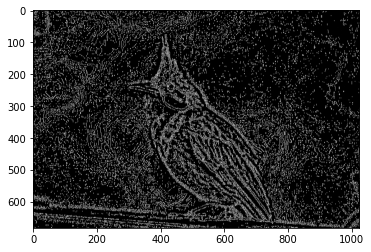

filter orientation:  135


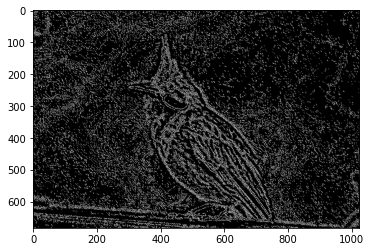

Superimpose the edge image: 


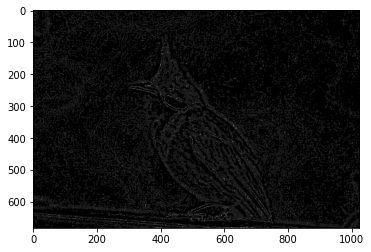




images:  Bird lower sigma:  4 higher sigma:  8


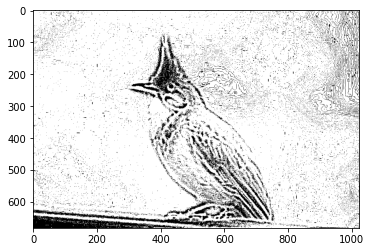

filter orientation:  0


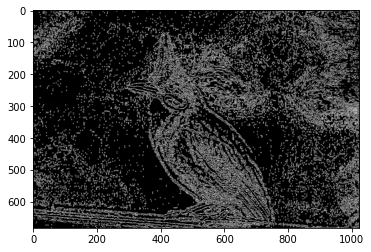

filter orientation:  45


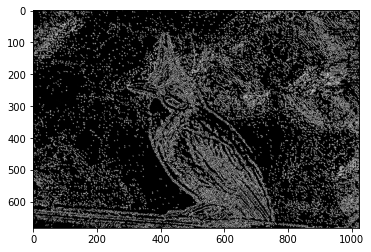

filter orientation:  90


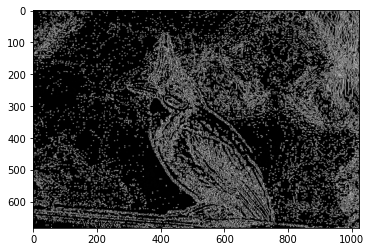

filter orientation:  135


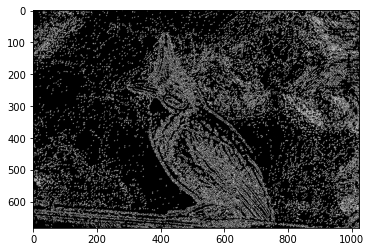

Superimpose the edge image: 


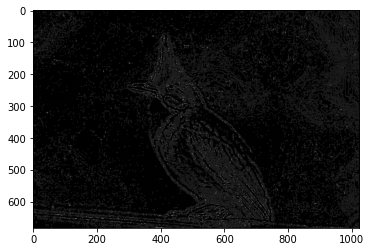




images:  Bird lower sigma:  4 higher sigma:  10.0


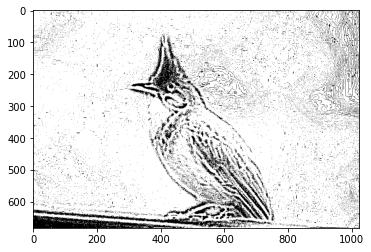

filter orientation:  0


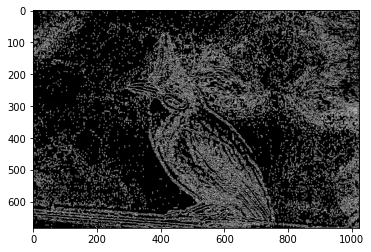

filter orientation:  45


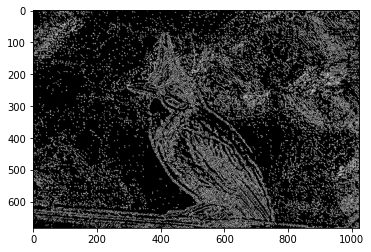

filter orientation:  90


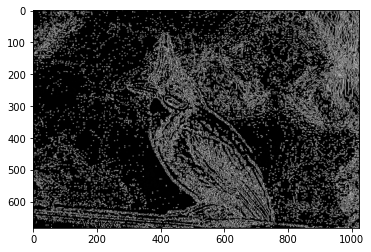

filter orientation:  135


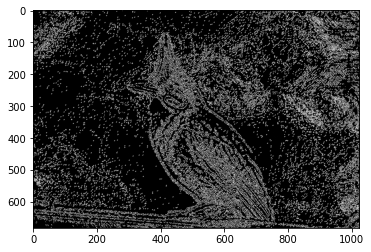

Superimpose the edge image: 


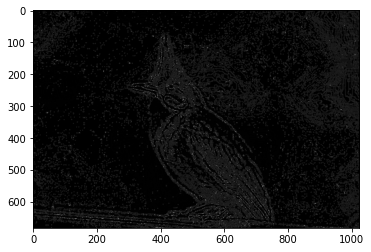




images:  Bird lower sigma:  4 higher sigma:  12


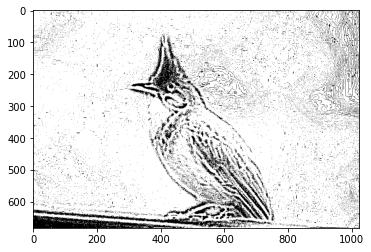

filter orientation:  0


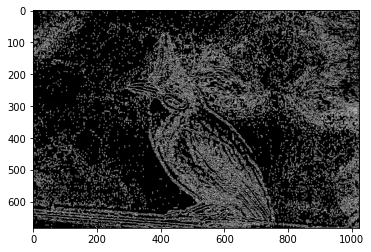

filter orientation:  45


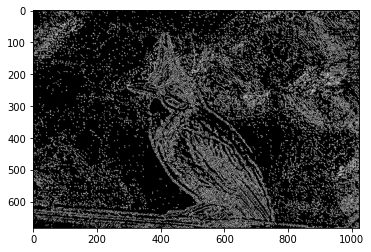

filter orientation:  90


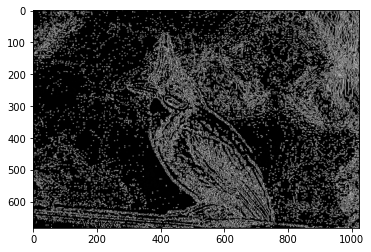

filter orientation:  135


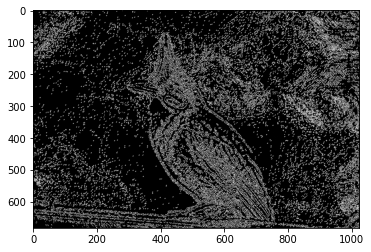

Superimpose the edge image: 


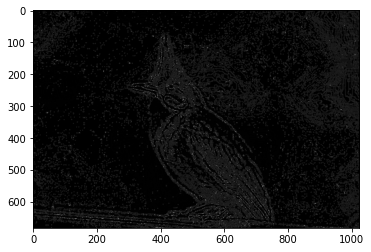




images:  Palace lower sigma:  1 higher sigma:  2


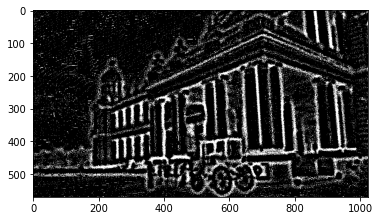

filter orientation:  0


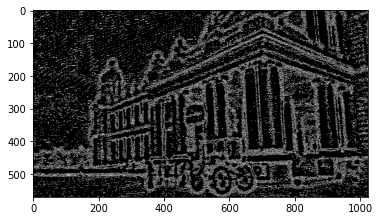

filter orientation:  45


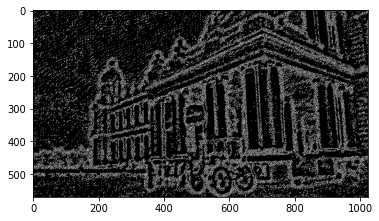

filter orientation:  90


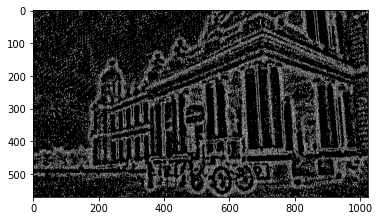

filter orientation:  135


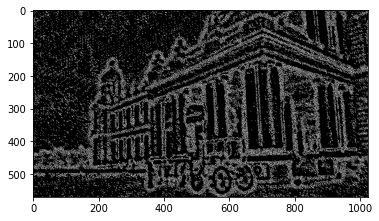

Superimpose the edge image: 


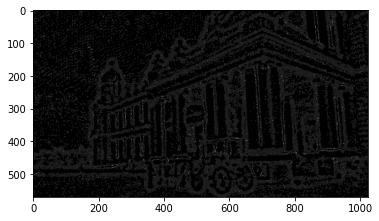




images:  Palace lower sigma:  1 higher sigma:  2.5


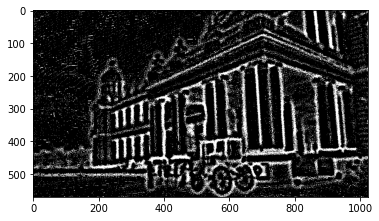

filter orientation:  0


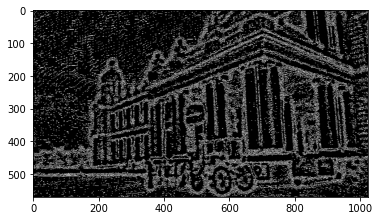

filter orientation:  45


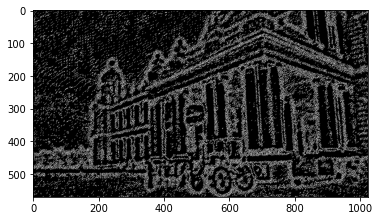

filter orientation:  90


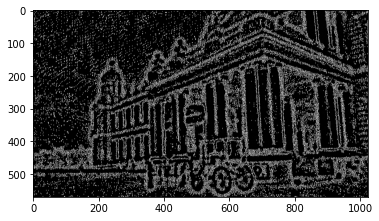

filter orientation:  135


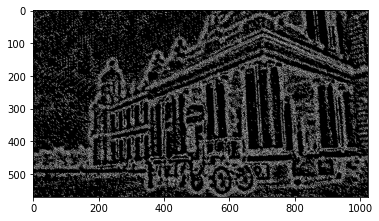

Superimpose the edge image: 


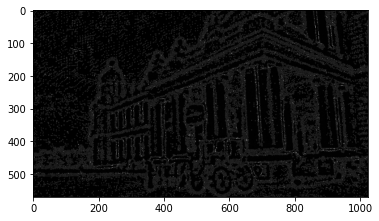




images:  Palace lower sigma:  1 higher sigma:  3


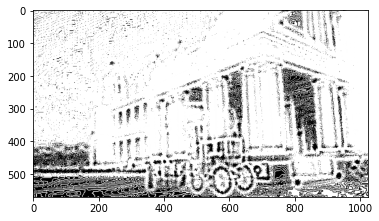

filter orientation:  0


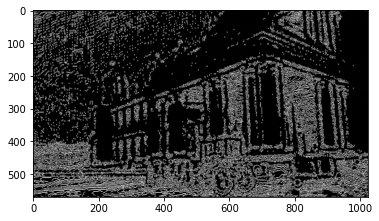

filter orientation:  45


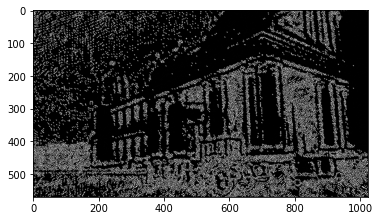

filter orientation:  90


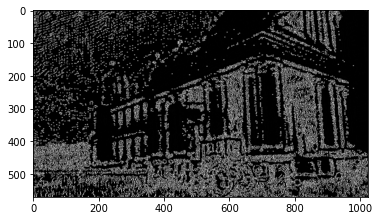

filter orientation:  135


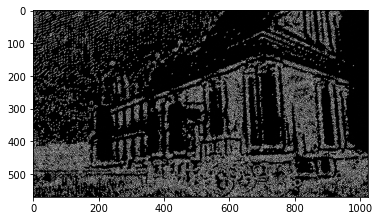

Superimpose the edge image: 


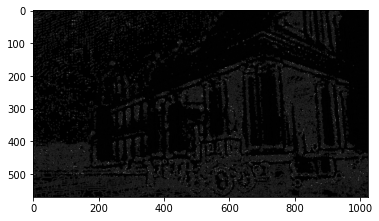




images:  Palace lower sigma:  2 higher sigma:  4


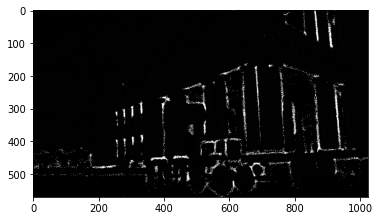

filter orientation:  0


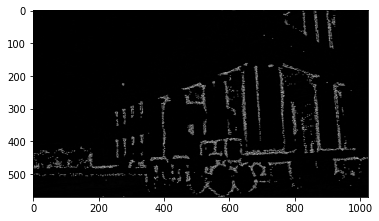

filter orientation:  45


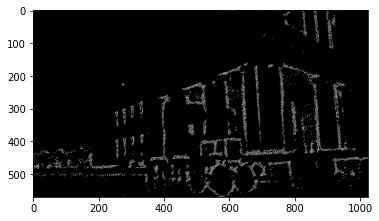

filter orientation:  90


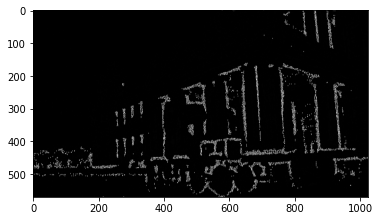

filter orientation:  135


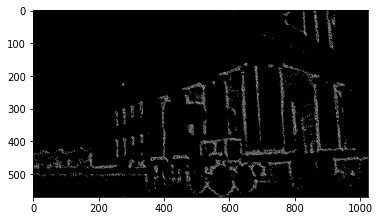

Superimpose the edge image: 


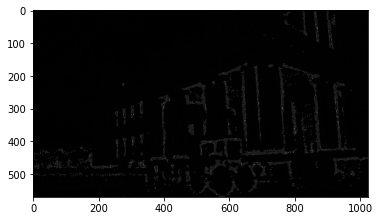




images:  Palace lower sigma:  2 higher sigma:  5.0


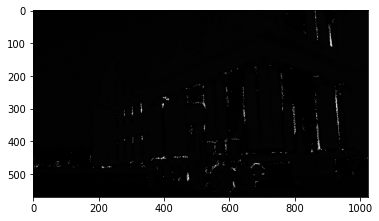

filter orientation:  0


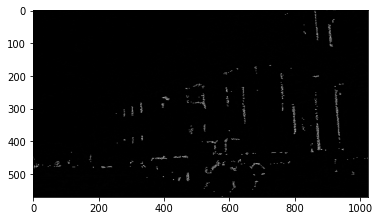

filter orientation:  45


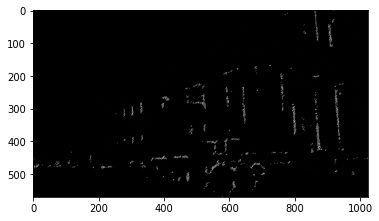

filter orientation:  90


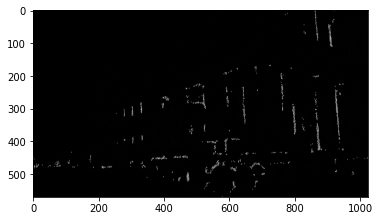

filter orientation:  135


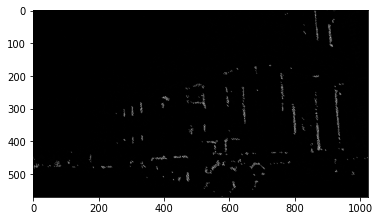

Superimpose the edge image: 


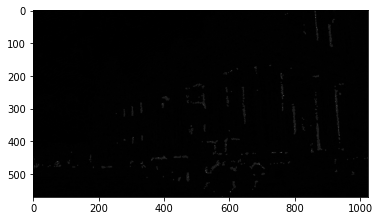




images:  Palace lower sigma:  2 higher sigma:  6


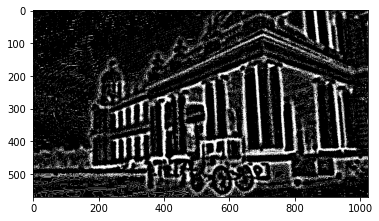

filter orientation:  0


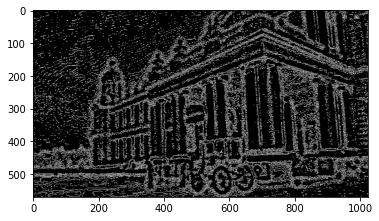

filter orientation:  45


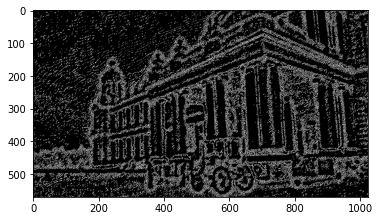

filter orientation:  90


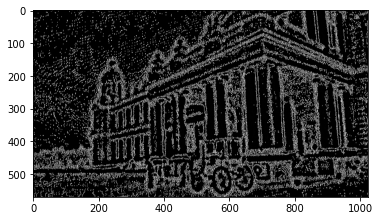

filter orientation:  135


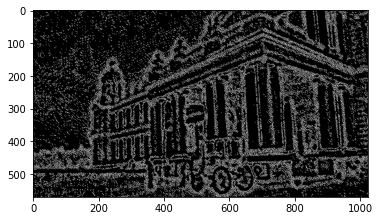

Superimpose the edge image: 


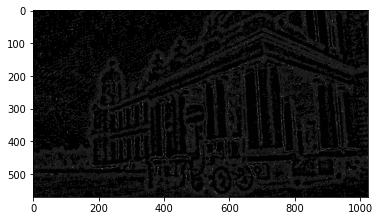




images:  Palace lower sigma:  4 higher sigma:  8


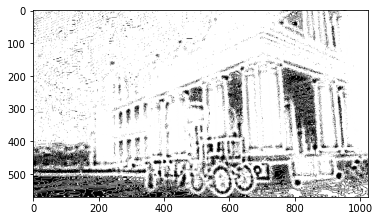

filter orientation:  0


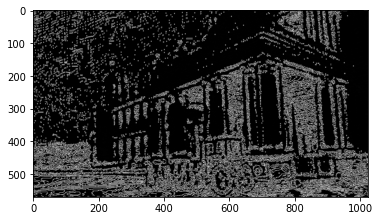

filter orientation:  45


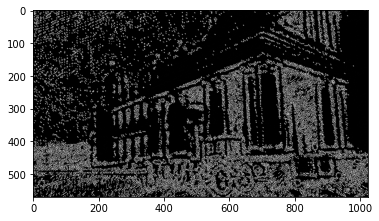

filter orientation:  90


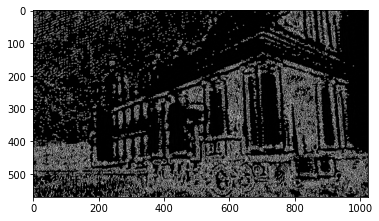

filter orientation:  135


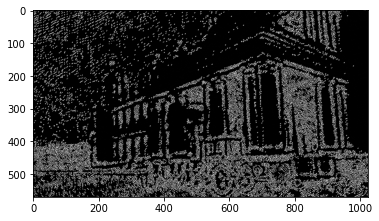

Superimpose the edge image: 


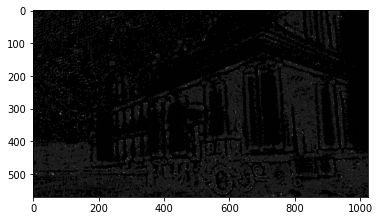




images:  Palace lower sigma:  4 higher sigma:  10.0


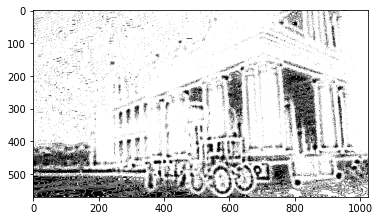

filter orientation:  0


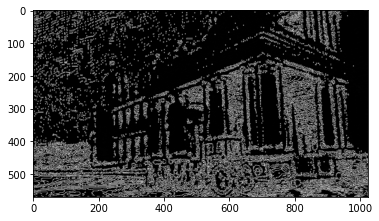

filter orientation:  45


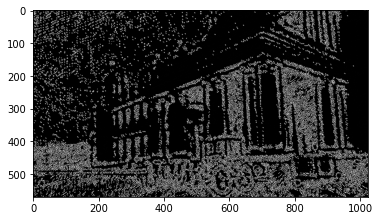

filter orientation:  90


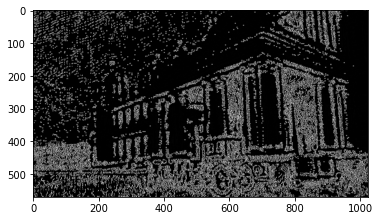

filter orientation:  135


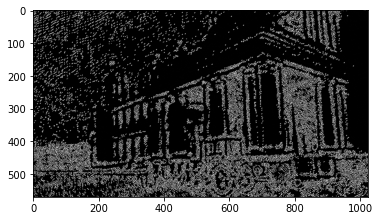

Superimpose the edge image: 


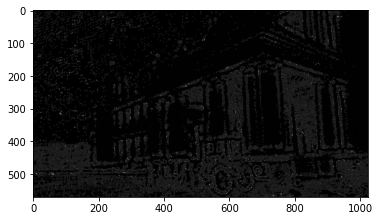




images:  Palace lower sigma:  4 higher sigma:  12


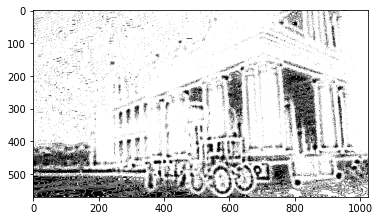

filter orientation:  0


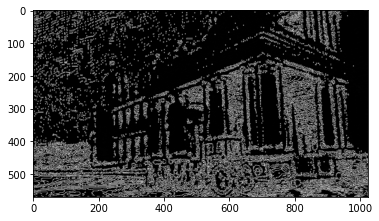

filter orientation:  45


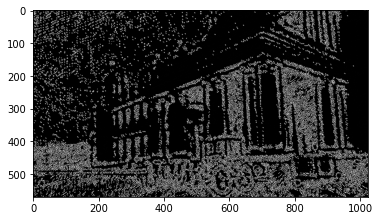

filter orientation:  90


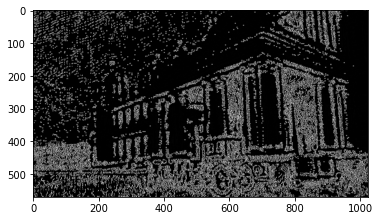

filter orientation:  135


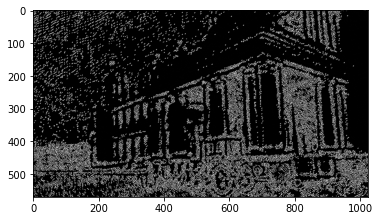

Superimpose the edge image: 


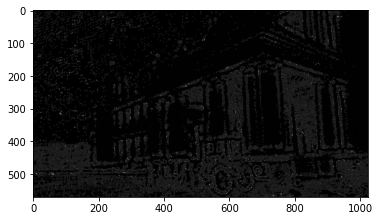

In [ ]:
#defining the hyper-parameters

#lower values of sigmas
low_sigmas = [1,2,4]

#Higher value of sigmas will be obtained using scaling factor as high sigma = low sigma * scaling factor 
scaling_factors = [2,2.5,3]

#defining a list containing both the input images and their name for print purpose
images = [imgBird,imgPalace]
image_names = ["Bird","Palace"]

#defining the filter corresponding to various orientations
degree = [0,45,90,135]
filters = [np.array([[-1, -1, -1],[2, 2, 2],[-1, -1, -1]]), np.array([[-1, -1, 2],[-1, 2, -1],[2, -1, -1]]),
           np.array([[-1, 2, -1],[-1, 2, -1],[-1, 2, -1]]),np.array([[2, -1, -1],[-1, 2, -1],[-1, -1, 2]])]


#The below part contains the required operations on the both images

#the three 'for' loops below generates the various combinations of image, high sigma, low sigma
for i in range(len(images)):
  for sigma_low in low_sigmas :
    for scale in scaling_factors:

      #generation of high sigma value
      sigma_high = sigma_low * scale
      #selecting the image
      img = images[i]

      #applying 3x3 and 5x5 guassian blur with varying value of sigma
      gblow = cv2.GaussianBlur(img,(3,3),sigma_low)          
      gbhigh = cv2.GaussianBlur(img,(5,5),sigma_high)

      #obtaining difference of guassian
      DoG = gblow - gbhigh

      #print the output of substraction i.e DoG (Part 1)
      print("images: ",image_names[i],"lower sigma: ",sigma_low,"higher sigma: ",sigma_high)
      plt.imshow(DoG, cmap='gray')
      plt.show()

      #part 2: applying the previously defined oriented filters by iterating the list

      edge_filtered_list = [] #this list stores the results of the four oriented filters applied on DoG

      for f in range(len(filters)):
        edge_img = cv2.filter2D(DoG, -1, filters[f])
        edge_filtered_list.append(edge_img)
        
        #print the output after applying the filter
        print("filter orientation: ",degree[f])
        plt.imshow(edge_img, cmap='gray')
        plt.show()

      #part 3: superimposing the edge images
      #obtaining the maximum intensity among the four orientation at each pixel 
      max_img = np.maximum(edge_filtered_list[0],np.maximum(edge_filtered_list[1],np.maximum(edge_filtered_list[2],
                                                         edge_filtered_list[3])))
      
      #taking the average of intensity in all four orientation at each pixel
      avg_img = (edge_filtered_list[0]+edge_filtered_list[1]+edge_filtered_list[2]+edge_filtered_list[3])/4
      
      #normalising and obtaining the superimposed image 
      superimpose_img = max_img/(avg_img+10) #to avoid divide by zero error adding a small number 10
      
      #printing the superimposed image
      print("Superimpose the edge image: ")
      plt.imshow(superimpose_img, cmap='gray')
      plt.show()
      print("\n\n")


